# Assignment on Wine Quality data
Zinia Sultana Joti

**Import Libraries**

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns
import stemgraphic

**Construct Data Frame using Wine Quality data**

In [2]:
white = pd.read_csv('winequality-white.csv', delimiter = ";")
red = pd.read_csv('winequality-red.csv', delimiter = ";")

In [111]:
red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [97]:
#Combining two data sets
total_wine = red.append(white, ignore_index = True)

In [118]:
#Creating the dataframe with following 5 rows using last two digit of my ID: 78
datarowSeries = [pd.Series([7.8,0.88, 0.0, 1.9, .09, 25, 67, .991, 3.22, .68, 9.8, 5],index = total_wine.columns), 
                 pd.Series([7.8+0.78,0.88+0.78, 0.0+0.78, 1.9, .09+0.78, 25+0.78, 67+0.78, .991+0.78, 3.22, .68+0.78, 9.8+0.78, 5],index = total_wine.columns),
                 pd.Series([7.2+0.78,0.83+0.78, 0.01+0.78, 2.2, .19+0.78, 15+0.78, 60+0.78, .996+0.78, 3.52, .55+0.78, 9.6+0.78, 6],index = total_wine.columns),
                 pd.Series([7.9+0.78,0.89+0.78, 0.01+0.78, 1.7, .08+0.78, 22+0.78, 57+0.78, .997+0.78, 3.26, .64+0.78, 9.8+0.78, 2],index = total_wine.columns),
                 pd.Series([7.7+0.78,0.86+0.78, 0.02+0.78, 2.3, .07+0.78, 11+0.78, 38+0.78, .994+0.78, 3.12, .08+0.78, 9.4+0.78, 3],index = total_wine.columns),
                 ]


In [119]:
#Final data set: red wine data, white wine data, and 5 new rows using ID: 78
df = total_wine.append(datarowSeries, ignore_index = True) 
df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


Reallocate the "quality" value

In [104]:
def modify_quality(value):
  '''
  Reallocate the wine quality value as 0: 0 to 5 ( Average quality)
  and 1: 6to 10 (Good Quality)
  >>> modify_quality(5)
  0
  >>> modify_quality(7)
  1
  
  '''
  if value <= 5:
    return 0
  else:
    return 1

# Directly assign the result of the function to the 'quality' column
df['quality'] = df['quality'].apply(modify_quality)

In [105]:
#Final DataFrame
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.40,0.70,0.00,1.9,0.076,11.00,34.00,0.9978,3.51,0.56,9.40,0
1,7.80,0.88,0.00,2.6,0.098,25.00,67.00,0.9968,3.20,0.68,9.80,0
2,7.80,0.76,0.04,2.3,0.092,15.00,54.00,0.9970,3.26,0.65,9.80,0
3,11.20,0.28,0.56,1.9,0.075,17.00,60.00,0.9980,3.16,0.58,9.80,1
4,7.40,0.70,0.00,1.9,0.076,11.00,34.00,0.9978,3.51,0.56,9.40,0
...,...,...,...,...,...,...,...,...,...,...,...,...
6497,7.80,0.88,0.00,1.9,0.090,25.00,67.00,0.9910,3.22,0.68,9.80,0
6498,8.58,1.66,0.78,1.9,0.870,25.78,67.78,1.7710,3.22,1.46,10.58,0
6499,7.98,1.61,0.79,2.2,0.970,15.78,60.78,1.7760,3.52,1.33,10.38,1
6500,8.68,1.67,0.79,1.7,0.860,22.78,57.78,1.7770,3.26,1.42,10.58,0


**Data Structure completed.**

### Data Description

In [13]:
df.shape

(6502, 12)

In [14]:
#null values
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [15]:
#data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6502 entries, 0 to 6501
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6502 non-null   float64
 1   volatile acidity      6502 non-null   float64
 2   citric acid           6502 non-null   float64
 3   residual sugar        6502 non-null   float64
 4   chlorides             6502 non-null   float64
 5   free sulfur dioxide   6502 non-null   float64
 6   total sulfur dioxide  6502 non-null   float64
 7   density               6502 non-null   float64
 8   pH                    6502 non-null   float64
 9   sulphates             6502 non-null   float64
 10  alcohol               6502 non-null   float64
 11  quality               6502 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 609.7 KB


There are 12 variables. Our target variable is quality variable, which is object type data. The other 11 variables are float data type.

**Variable decription**

To understand the central tendency, spread, and potential skewness of the data, using df.describe()

In [16]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000,6502.000000
mean,7.216144,0.340552,0.318874,5.440588,0.056551,30.517398,115.700495,0.995176,3.218539,0.531744,10.491656,0.632728
std,1.296323,0.167861,0.145785,4.756935,0.040659,17.745527,56.523208,0.019568,0.160774,0.149994,1.192292,0.482098
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,0.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996997,3.320000,0.600000,11.300000,1.000000
max,15.900000,1.670000,1.660000,65.800000,0.970000,289.000000,440.000000,1.777000,4.010000,2.000000,14.900000,1.000000


In [17]:
df.mean()

fixed acidity             7.216144
volatile acidity          0.340552
citric acid               0.318874
residual sugar            5.440588
chlorides                 0.056551
free sulfur dioxide      30.517398
total sulfur dioxide    115.700495
density                   0.995176
pH                        3.218539
sulphates                 0.531744
alcohol                  10.491656
quality                   0.632728
dtype: float64

In [18]:
df.mode()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.8,0.28,0.3,2.0,0.044,29.0,111.0,0.9972,3.16,0.5,9.5,1.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9976,NaN,NaN,NaN,NaN


In [19]:
df.median()

fixed acidity             7.00000
volatile acidity          0.29000
citric acid               0.31000
residual sugar            3.00000
chlorides                 0.04700
free sulfur dioxide      29.00000
total sulfur dioxide    118.00000
density                   0.99489
pH                        3.21000
sulphates                 0.51000
alcohol                  10.30000
quality                   1.00000
dtype: float64

In [106]:
df.std()

fixed acidity            1.296323
volatile acidity         0.167861
citric acid              0.145785
residual sugar           4.756935
chlorides                0.040659
free sulfur dioxide     17.745527
total sulfur dioxide    56.523208
density                  0.019568
pH                       0.160774
sulphates                0.149994
alcohol                  1.192292
quality                  0.482098
dtype: float64

**Created a table to assemble all the values for mean, mode, median, std table is on the doc file**

Highlights:
- The median is smaller than mean for most of the variables.
Skewness of the variables: 
- slightly right skewed alcohol
- residual sugar is right skewed
- about symmetry: fixed acidity, volatile, citric acid, chlorides, free sulfur dioxide,total suldur dioxide, pH, sulphates, 
- symmetry: density

Spread/std check:
- Based on the standard deviations, residual sugar, free sulfur dioxide, and total sulfur dioxide exhibit high variability in the data. Among these, total sulfur dioxide has the highest standard deviation, indicating a wider spread of values compared to the other variables. 
- While the standard deviations for the other variables suggest a more moderate range, further investigation into the expected ranges for these wine quality variables would be beneficial. 


potential outliers: 
- From the summary statistics, we can not pinpoint specific outliers, we can identify which may need further investigation. This includes fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, and alcohol.




Here we can see all the variables may have outliers, to check outliers more accurately we will use boxplot.

**Summary Measures**

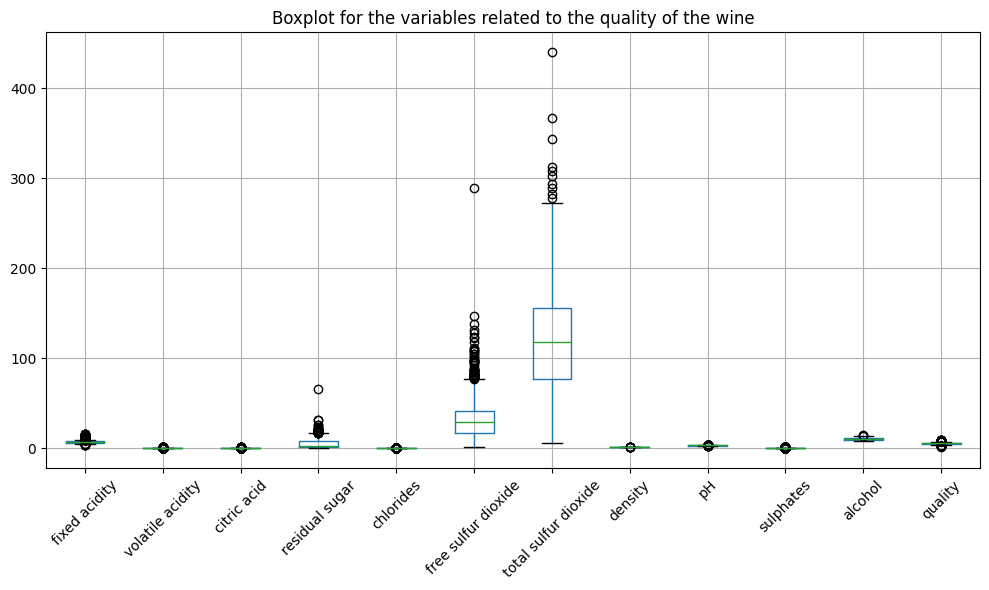

In [120]:
# Exclude the 'quality' column from the list of columns for the boxplot
plt.figure(figsize=(10, 6))
df.drop('quality', axis = 1)
df.boxplot()
plt.title('Boxplot for the variables related to the quality of the wine')
plt.xticks(rotation=45)
plt.tight_layout() 
plt.show()

The boxplot reveals outliers in all variables. However, "residual sugar," "free sulfur dioxide," and "total sulfur dioxide" exhibit a significantly higher number of outliers compared to the other variables. 

## Univariate Analysis

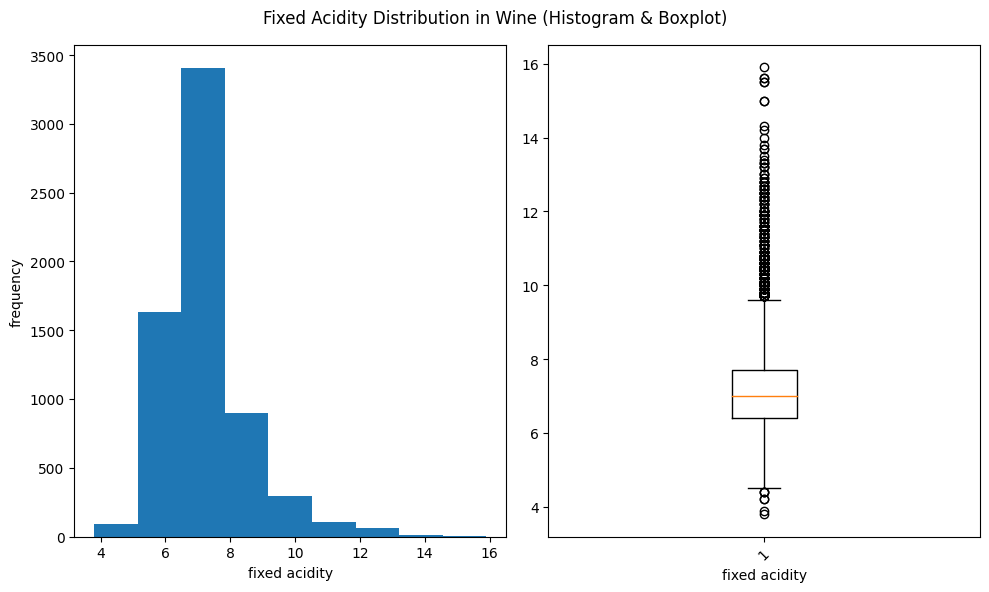

In [68]:
# Fixed Acidity

x = 'fixed acidity'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Fixed Acidity Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

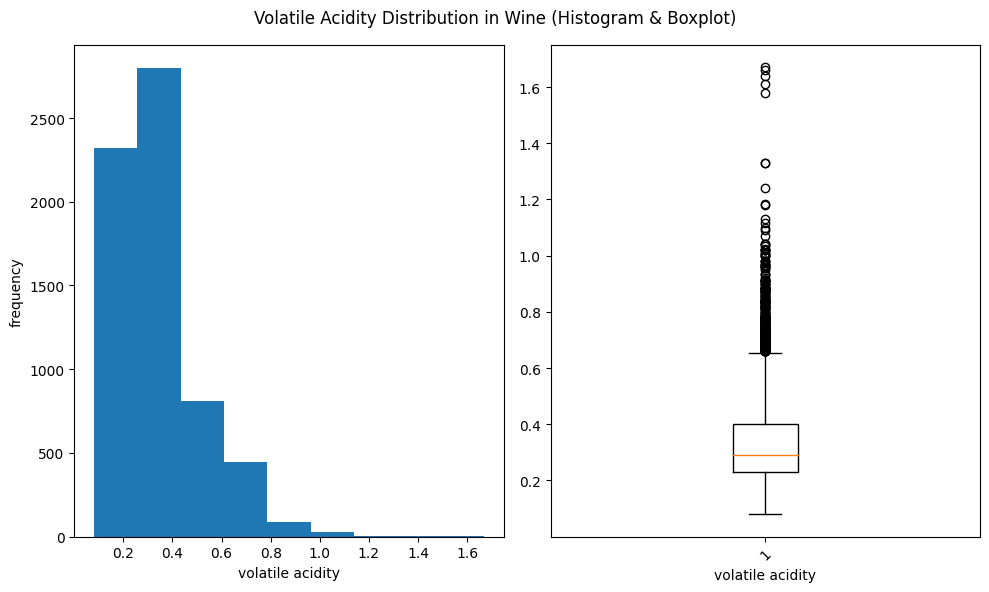

In [69]:
# Volatile Acidity

x = 'volatile acidity'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Volatile Acidity Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

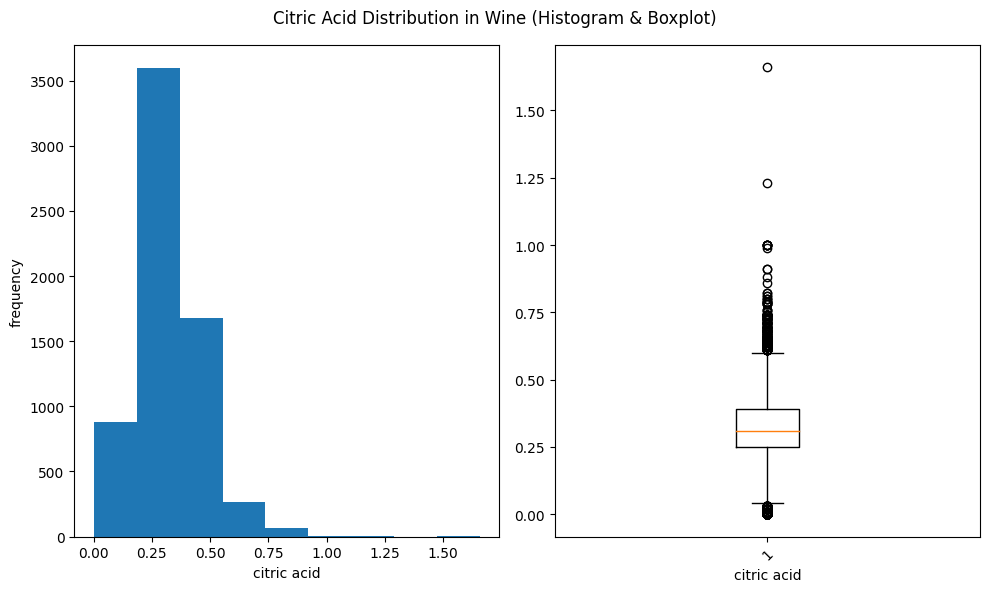

In [86]:
# Citric Acid

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))
x = 'citric acid'

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Citric Acid Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

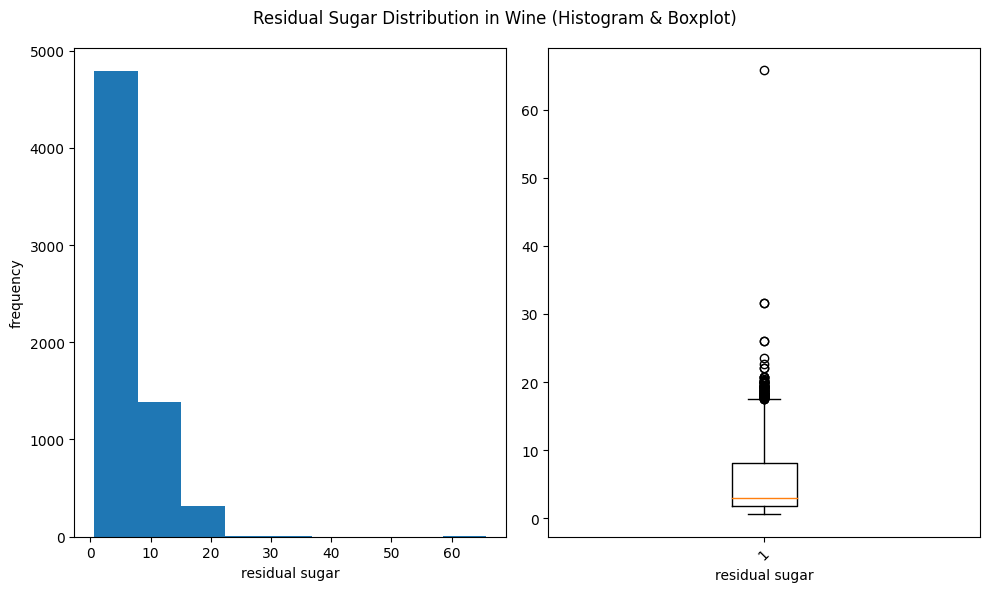

In [72]:
# residual sugar 

x = 'residual sugar'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Residual Sugar Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

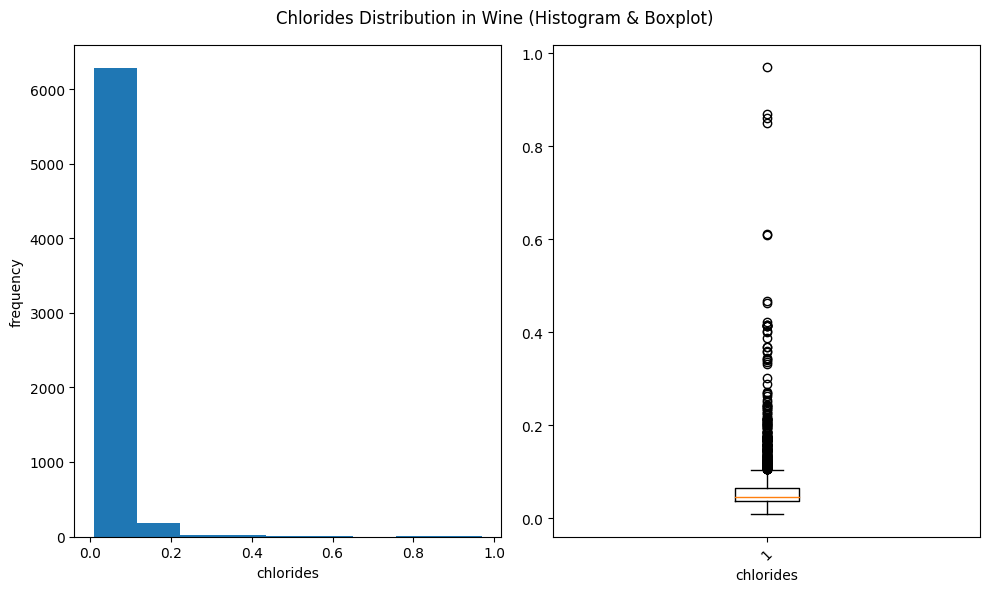

In [73]:
# chlorides 

x = 'chlorides'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Chlorides Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

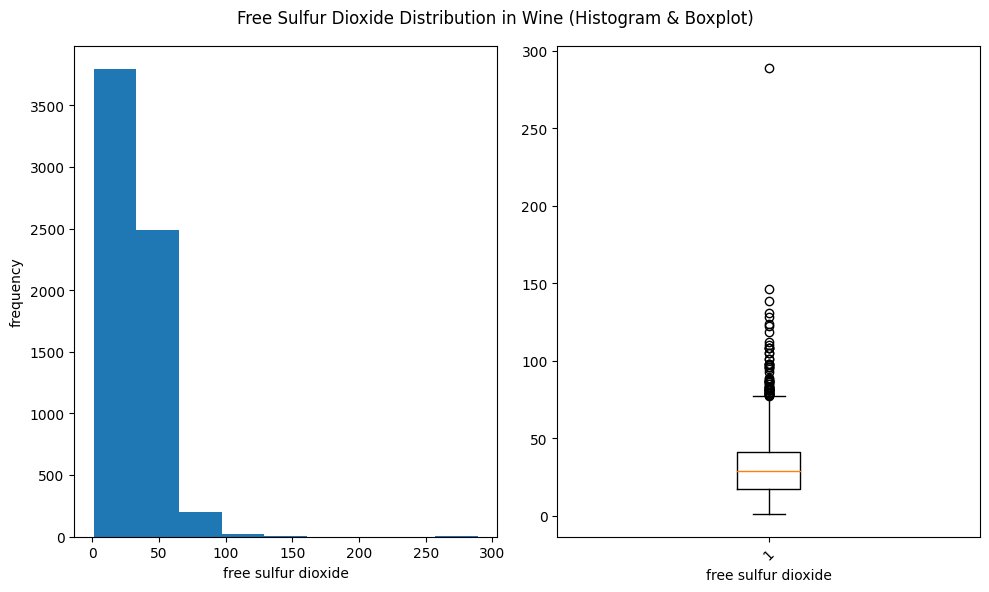

In [76]:
# free sulfur dioxide

x = 'free sulfur dioxide'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Free Sulfur Dioxide Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

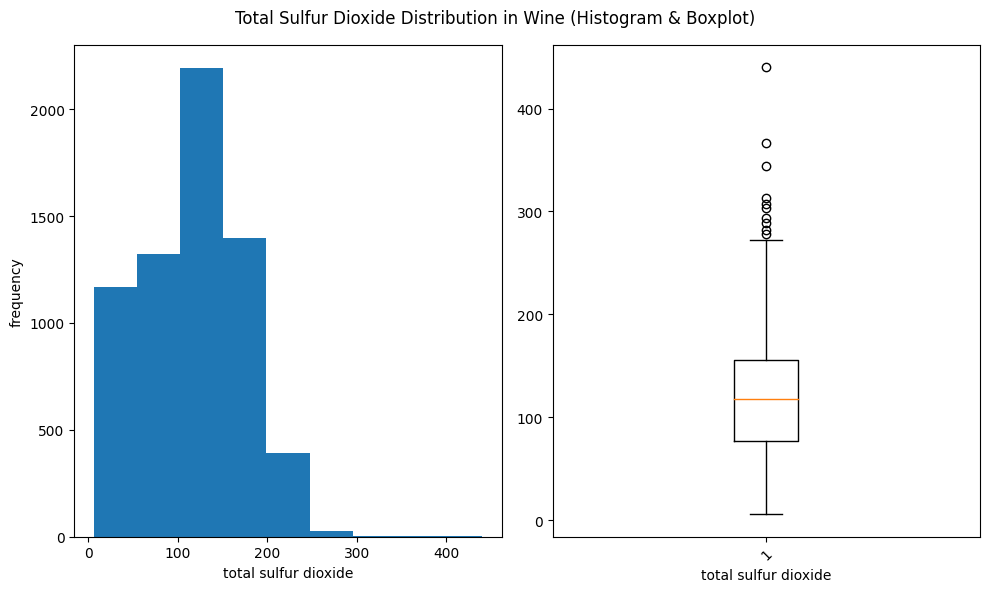

In [77]:
# total sulfur dioxide

x = 'total sulfur dioxide'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Total Sulfur Dioxide Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

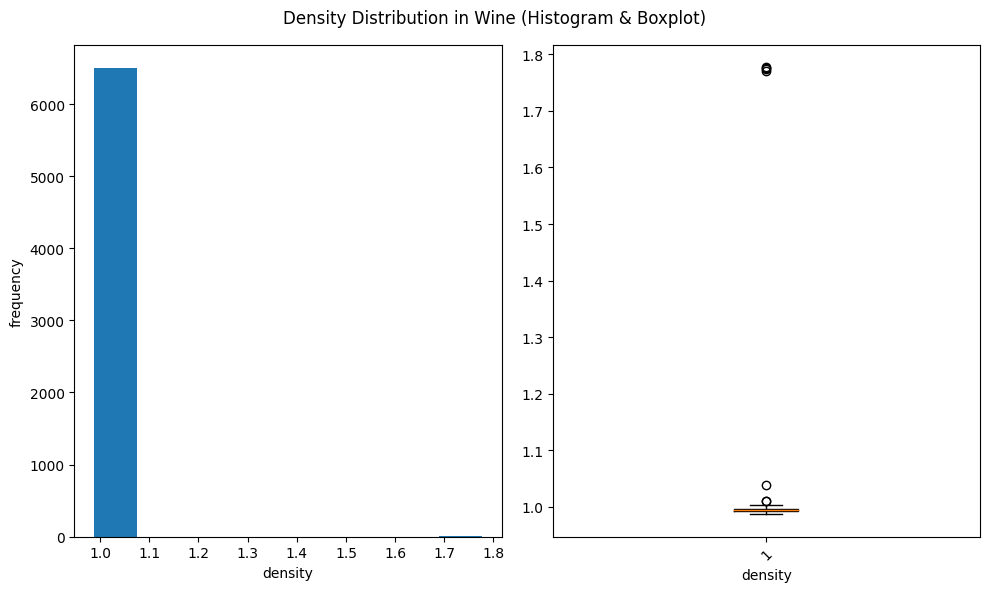

In [78]:
# density 

x = 'density'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Density Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

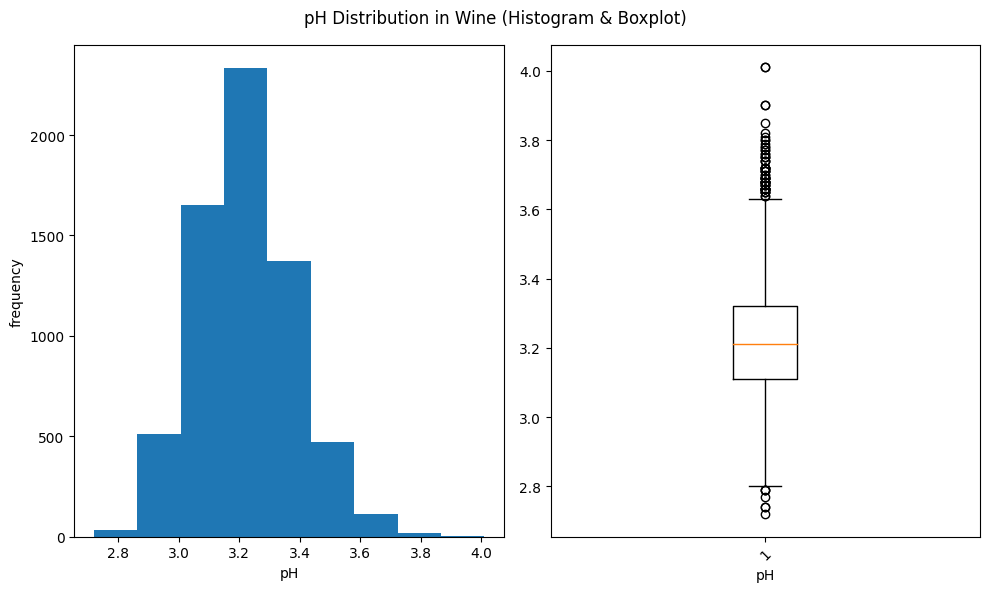

In [81]:
# pH

x = 'pH'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("pH Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

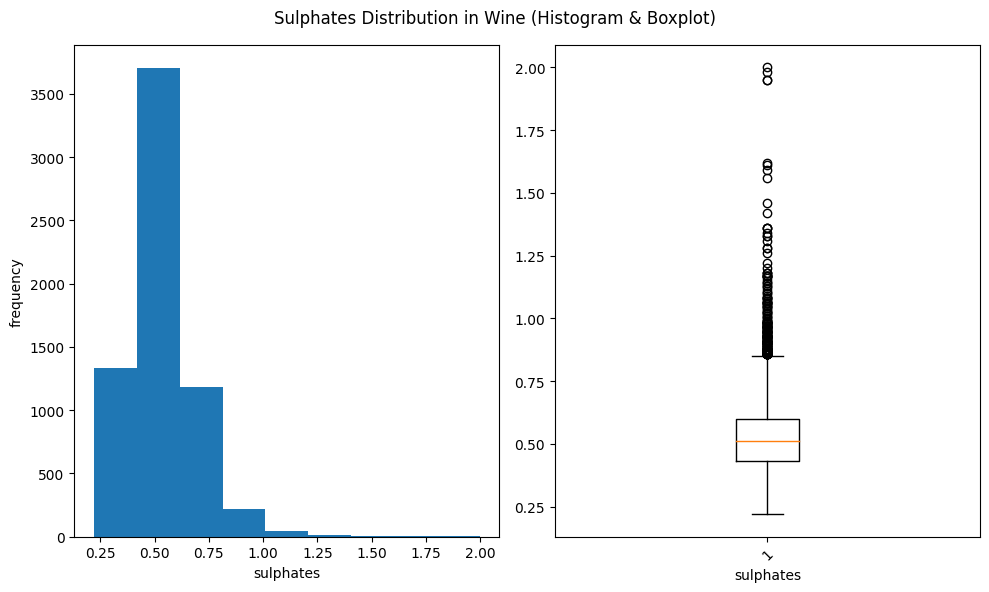

In [82]:
# sulphates

x = 'sulphates'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Sulphates Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

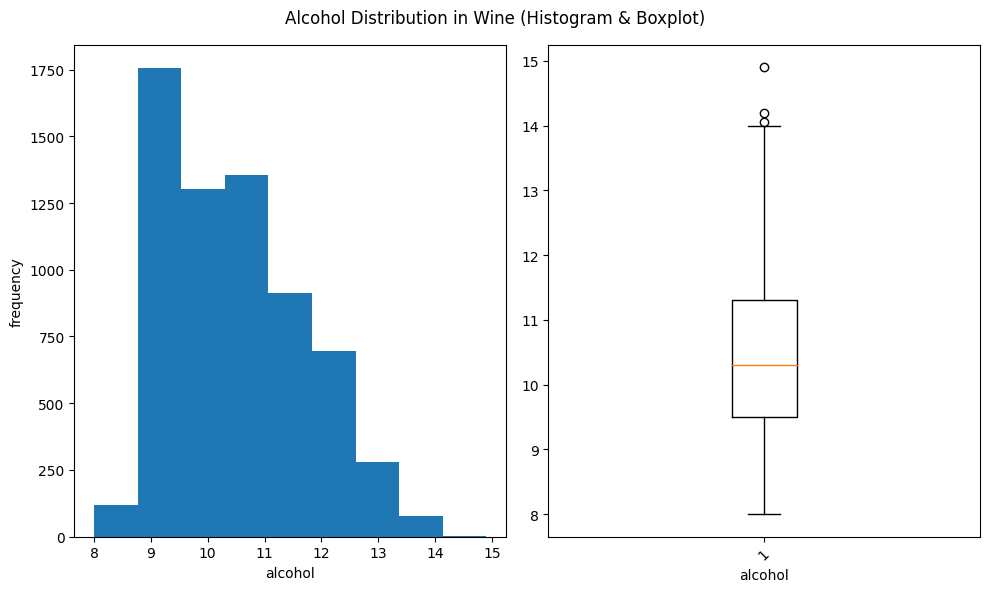

In [83]:
# alcohol

x = 'alcohol'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

ax1.hist(df[x], bins = 9)
ax1.set_xlabel(x)
ax1.set_ylabel('frequency')

ax2.boxplot(df[x])
ax2.set_xlabel(x)

plt.suptitle("Alcohol Distribution in Wine (Histogram & Boxplot)")


plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

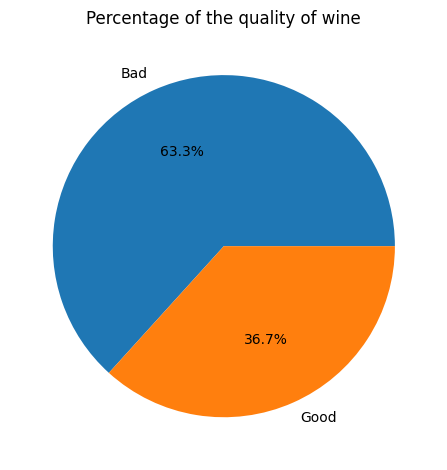

In [107]:
# quality

x = df.quality.value_counts().to_numpy()

plt.pie(x, labels = ['Bad', 'Good'], autopct = '%1.1f%%')


plt.title('Percentage of the quality of wine')
plt.xticks(rotation=45) 
plt.tight_layout()

plt.show()

## Bivariate Analysis

### Pair Plots

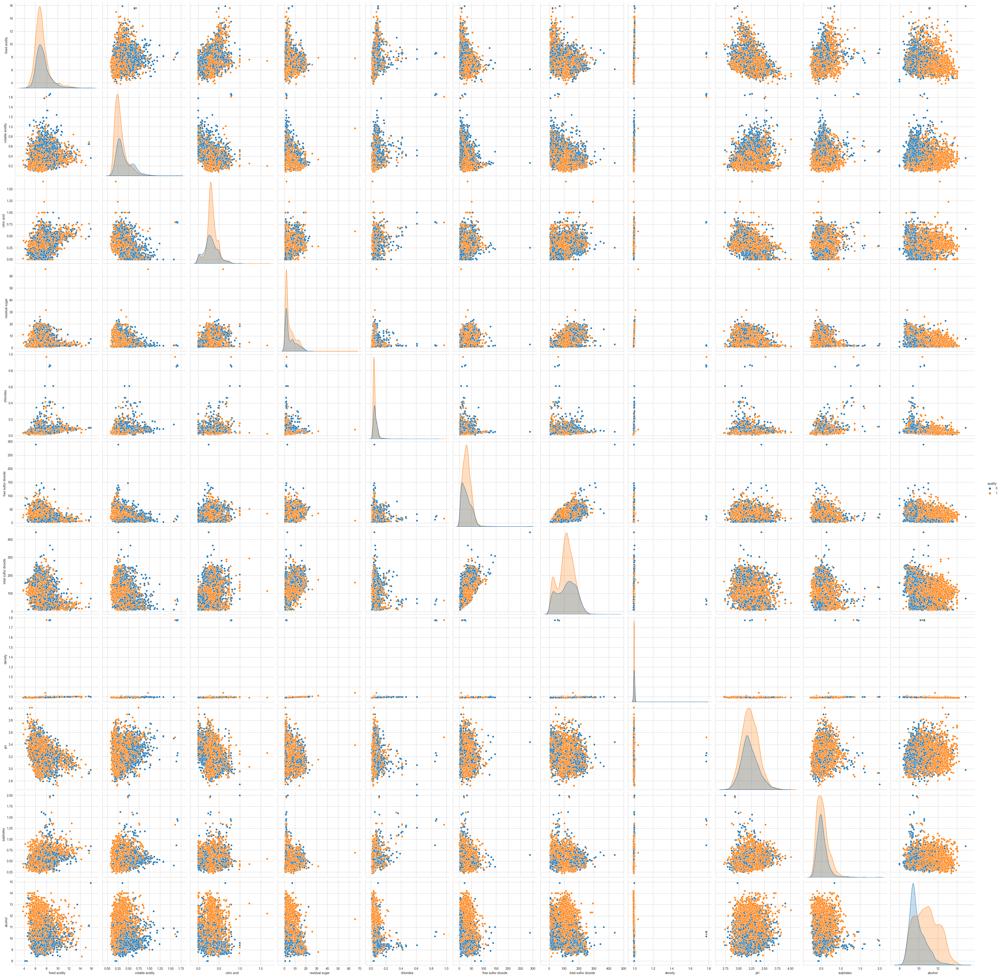

In [98]:
#####Pairplots
sns.set_style('whitegrid');
sns.pairplot(df, hue = 'quality', height = 4)
plt.show()

**Correlation**

To identify potential relationships between numerical variables

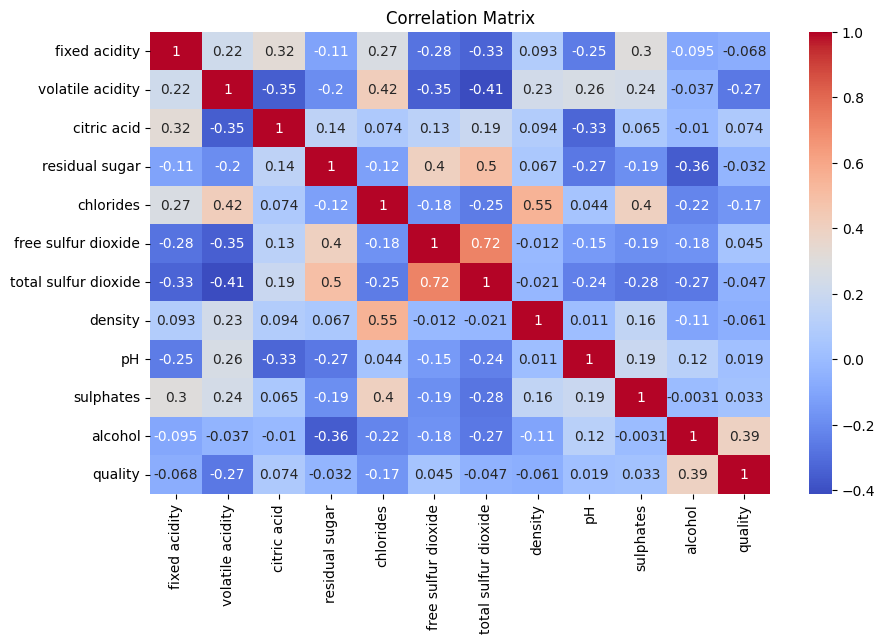

In [23]:
correlation = df.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

There are some strong linear relation between the variables:
- free sulfur dioxide to total sulfur dioxide : 0.72; stong positive 
- density to chlorides : 0.55, moderate positive
- residual sugar to total sulfur dioxide : 0.5; moderate positive
- volatile acidity to cholide , free sulfur dioxide to residual sugar and suphates to chlorides have almost moderate positive linear relation.
- Free sulfur dioxide to total sulfur dioxide : 0.72; stong positive
- Alternatively, volatile acidity to total sulfur dioxide(-0.41) moderate negative linear relationship. 


**Scatter plots for all the variables colored by Quality**

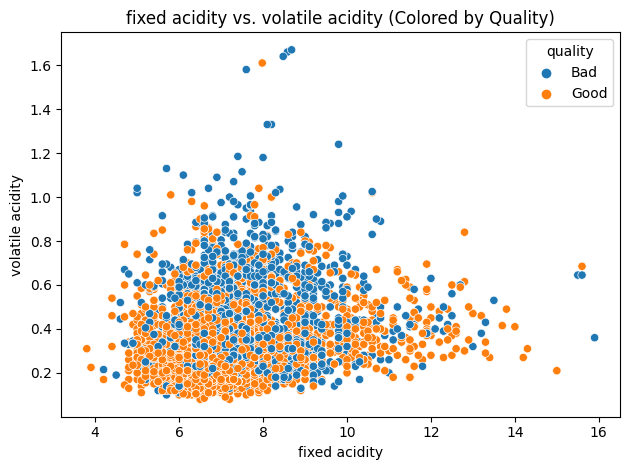

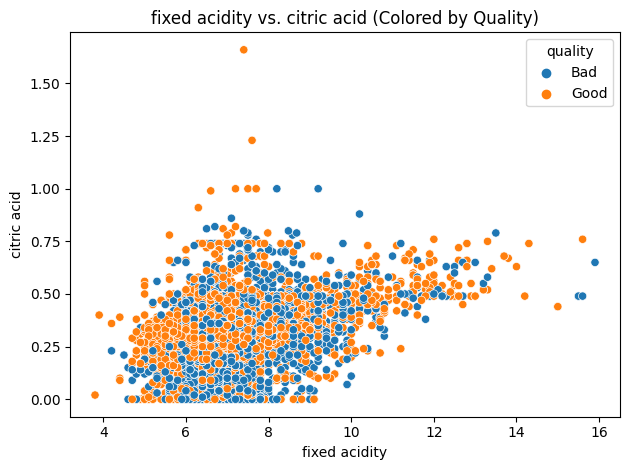

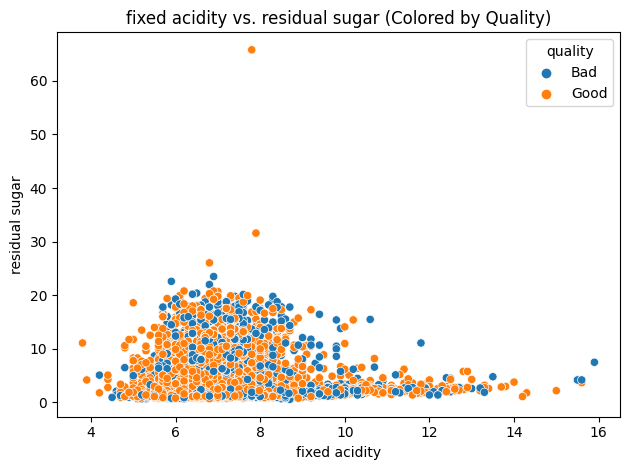

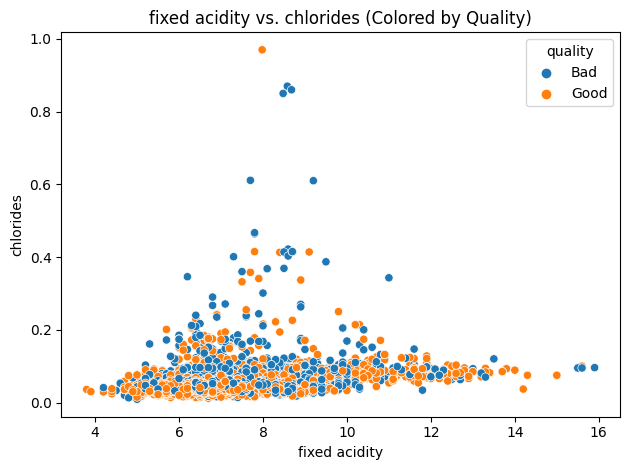

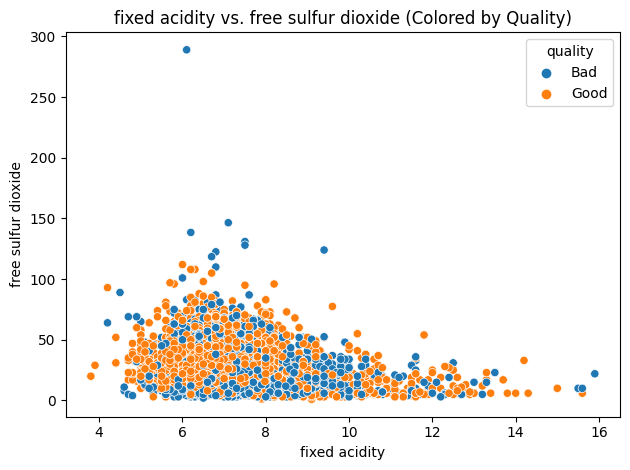

...

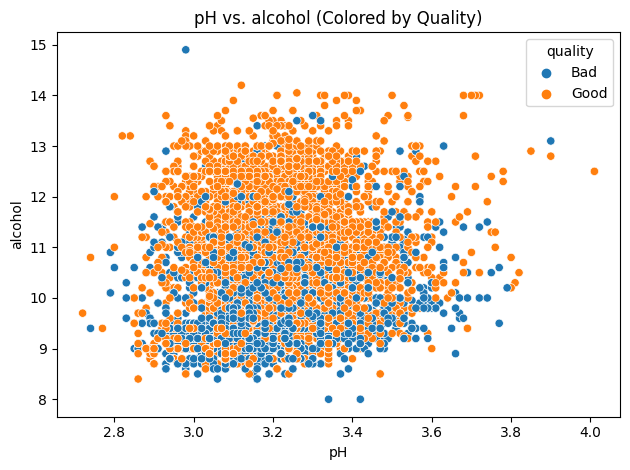

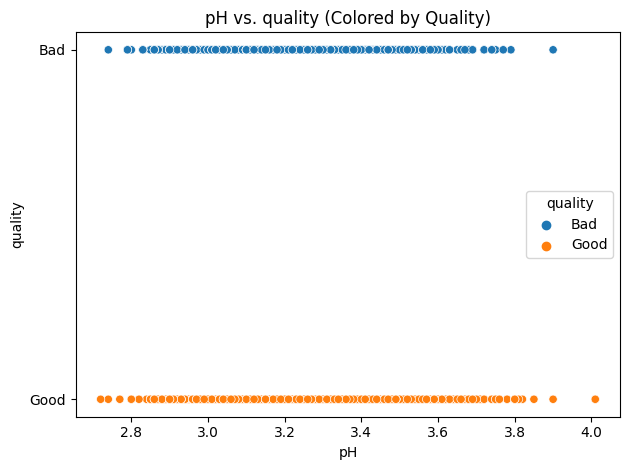

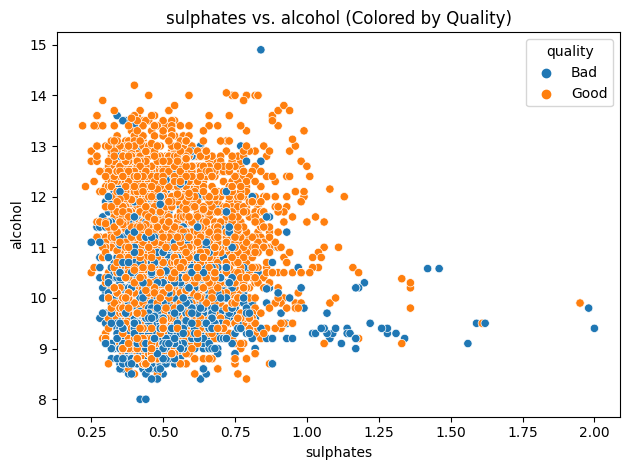

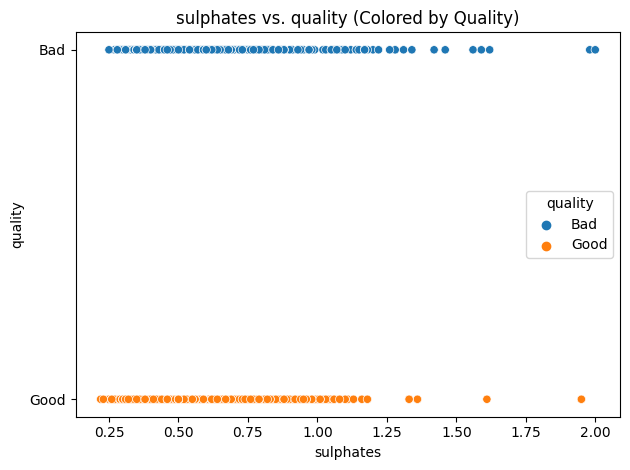

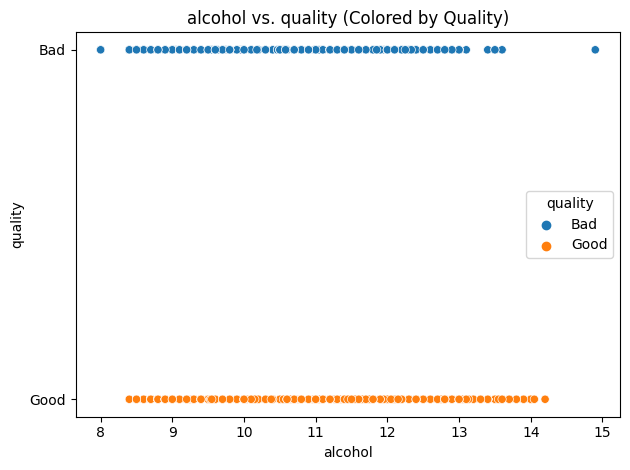

In [108]:
df['quality'] = df['quality'].map({0:'Bad', 1: 'Good'})
for col1 in df.columns:
  for col2 in df.columns[df.columns.get_loc(col1) + 1:]:  
    sns.scatterplot(x=col1, y=col2, hue='quality', data=df)
    plt.title(f"{col1} vs. {col2} (Colored by Quality)")
    plt.tight_layout()
    plt.show()

**Boxplot for all the variables colored by Quality**

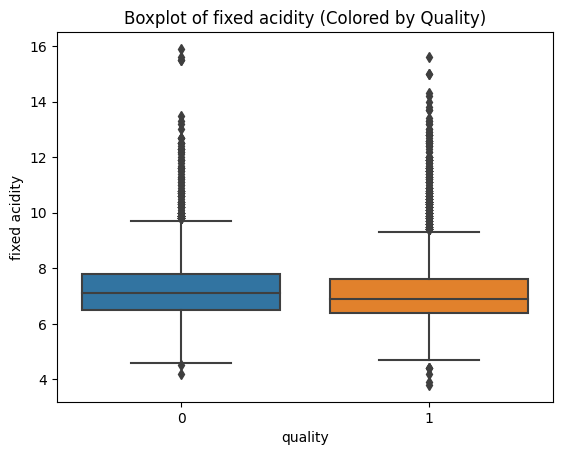

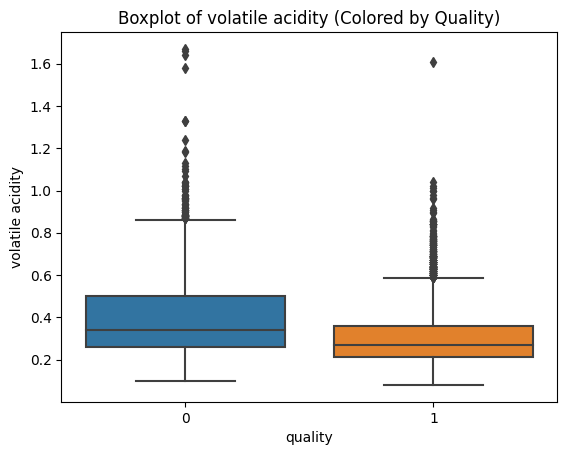

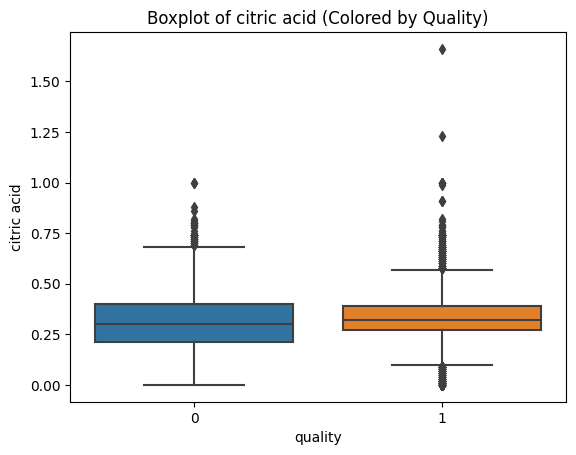

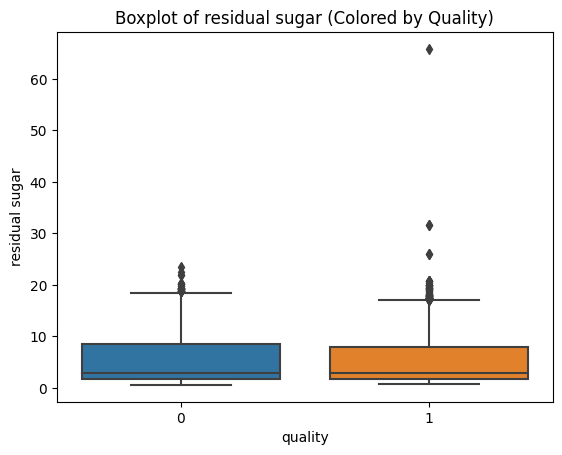

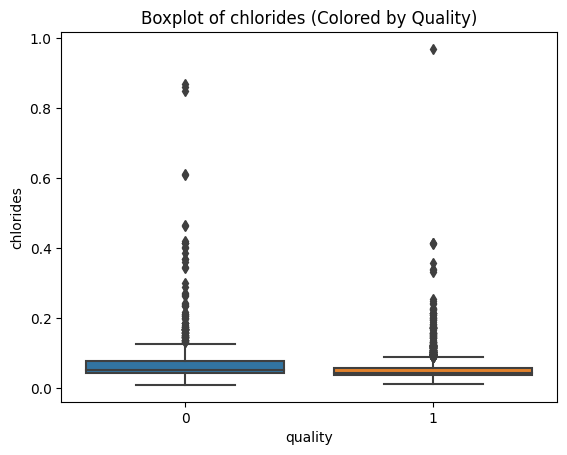

...

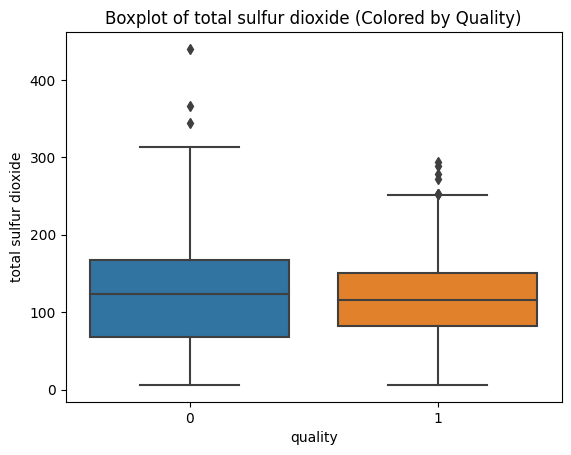

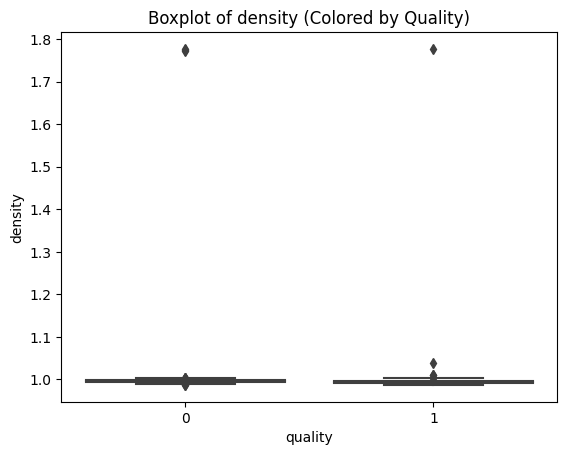

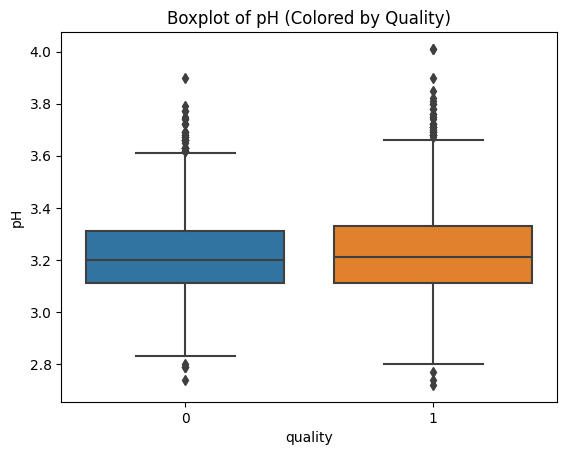

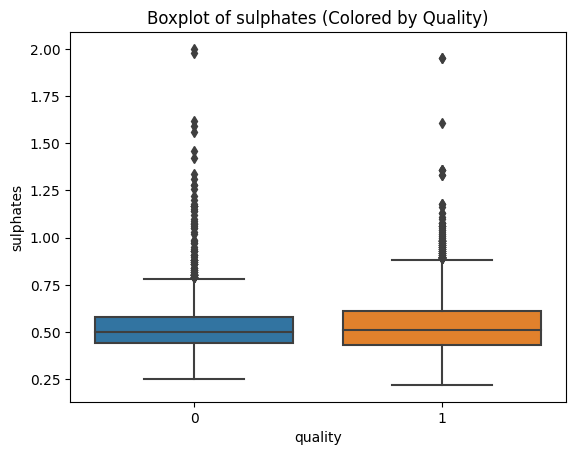

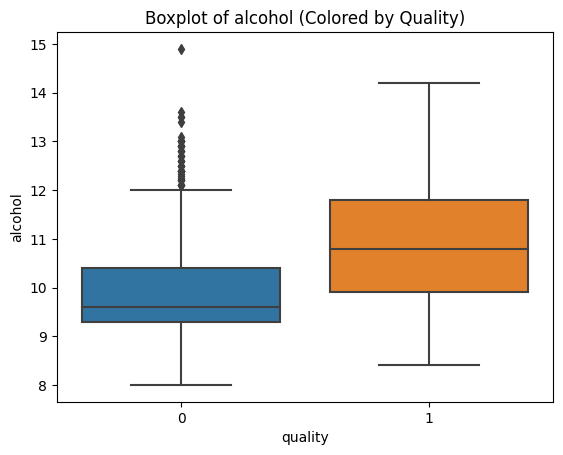

In [82]:
for col in df.drop('quality', axis = 1).columns:
  sns.boxplot(x='quality', y= col, data=df)
  plt.title(f"Boxplot of {col} (Colored by Quality)")
  plt.show()

## Regression Model

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score, classification_report, accuracy_score

from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [109]:
#2 logistic regression using sklearn

X = df.drop('quality',axis = 1) #independent
y = df['quality'] #target/dependent variable


#logistic model
logit = LogisticRegression()
logit.fit(X, y)

print('Coefficients:\n', logit.coef_)
print('Intercept:', logit.intercept_)

Coefficients:
 [[-0.17247506 -4.11639612  0.33790097  0.03862691 -0.34710538  0.0182845
  -0.01052447 -1.01700789 -0.97215352  1.8427718   0.75905165]]
Intercept: [-1.06225756]


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [124]:
np.exp(logit.intercept_)

array([0.34567455])

In [123]:
results = np.exp(logit.coef_)
results

array([[0.84157928, 0.01630316, 1.40200166, 1.03938263, 0.70673085,
        1.01845268, 0.98953072, 0.3616755 , 0.37826755, 6.31401521,
        2.13624936]])

### Logistic Regression Model

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


ROC AUC Score: 0.7915799389406544
Logistic Regression Model
Confusion Matrix:
 [[ 381  329]
 [ 196 1045]]
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.54      0.59       710
           1       0.76      0.84      0.80      1241

    accuracy                           0.73      1951
   macro avg       0.71      0.69      0.70      1951
weighted avg       0.72      0.73      0.72      1951

Accuracy Score: 0.7309072270630446
Sensitivity: 0.8420628525382756
Specificity: 0.5366197183098591
Precision: 0.7605531295487628


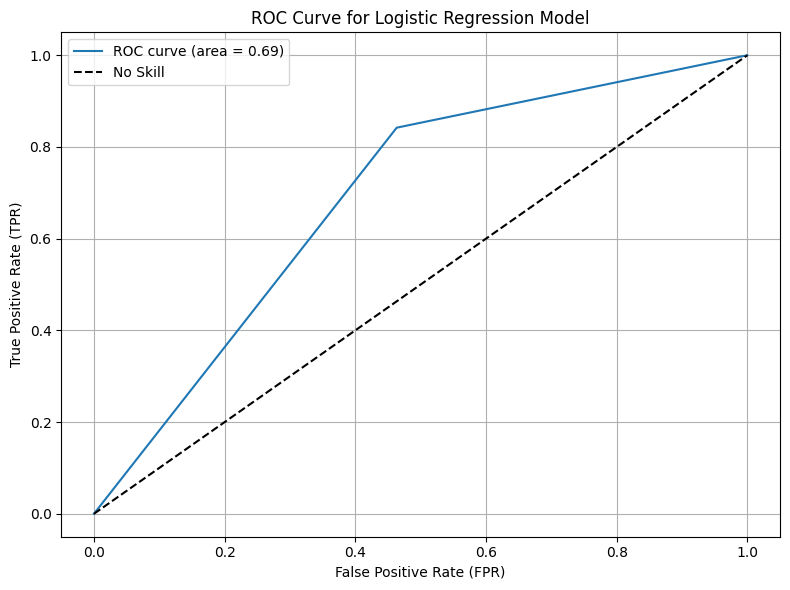

In [143]:
#3(i)
logmodel = LogisticRegression()
logmodel.fit(X_train, y_train)

y_pred = logmodel.predict(X_test)
roc_auc = roc_auc_score(y_test, model.decision_function(X_test))
print("ROC AUC Score:", roc_auc)

print("Logistic Regression Model")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
tn,fp, fn, tp = cm.ravel()
sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp/(tp+fp)

print("Sensitivity:", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)

#ROC Curve:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)  
roc_auc = roc_auc_score(y_test, y_pred) 

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Logistic Regression Model')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Decision Trees

Decision Trees 
Confusion Matrix:
 [[491 219]
 [250 991]]
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.69      0.68       710
           1       0.82      0.80      0.81      1241

    accuracy                           0.76      1951
   macro avg       0.74      0.75      0.74      1951
weighted avg       0.76      0.76      0.76      1951

Accuracy Score: 0.7596104561763198
Precision: 0.8190082644628099
Sensitivity: 0.798549556809025
Specificity: 0.6915492957746479


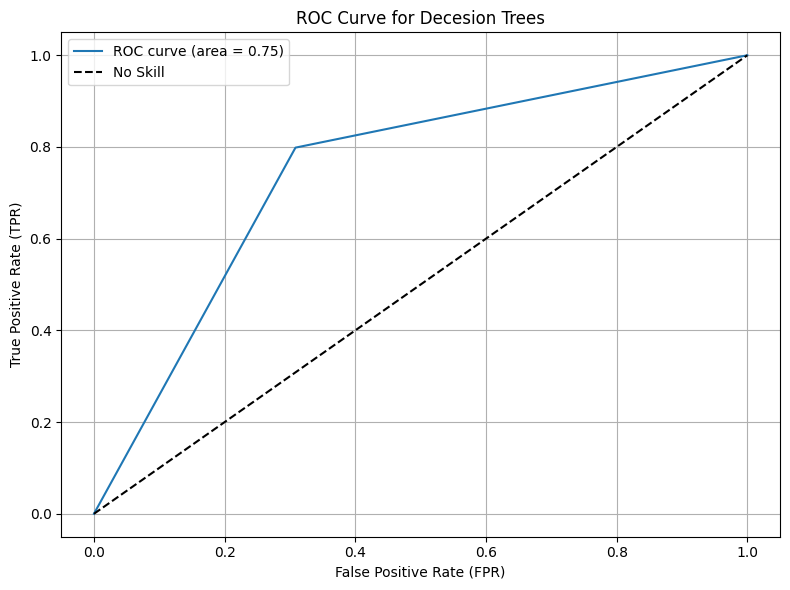

In [144]:
#3(ii)
DTclf=tree.DecisionTreeClassifier()

DTclf.fit(X_train, y_train)
y_pred= DTclf.predict(X_test) ##y_test= Y, y_pred=Y^

print("Decision Trees ")

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

#Sensitivity, Specificity
cm = confusion_matrix(y_test, y_pred)
tn,fp, fn, tp = cm.ravel()

sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp/(tp+fp)
print("Precision:", precision)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)


#ROC Curve:

fpr, tpr, thresholds = roc_curve(y_test, y_pred)  
roc_auc = roc_auc_score(y_test, y_pred) 

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Decesion Trees')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Random Forest Model

Random Forest Model
Confusion Matrix:
 [[ 503  207]
 [ 160 1081]]
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.71      0.73       710
           1       0.84      0.87      0.85      1241

    accuracy                           0.81      1951
   macro avg       0.80      0.79      0.79      1951
weighted avg       0.81      0.81      0.81      1951

Accuracy Score: 0.8118913377754997
Precision: 0.8392857142857143
Sensitivity: 0.871071716357776
Specificity: 0.7084507042253522


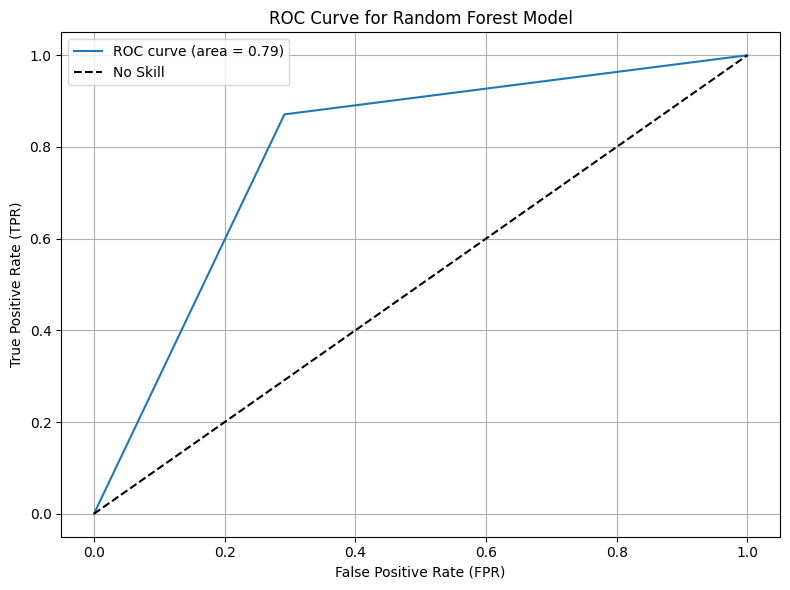

In [145]:
#3(iii)
RFclf=RandomForestClassifier(n_estimators=11)

RFclf.fit(X_train, y_train)
y_pred=RFclf.predict(X_test)

print("Random Forest Model")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
tn,fp, fn, tp = cm.ravel()

sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp/(tp+fp)
print("Precision:", precision)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)


#ROC Curve:
fpr, tpr, thresholds = roc_curve(y_test, y_pred)  
roc_auc = roc_auc_score(y_test, y_pred) 

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Random Forest Model')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### Support Vector Machines

Support Vector Machines
Confusion Matrix:
 [[ 406  304]
 [ 197 1044]]
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.57      0.62       710
           1       0.77      0.84      0.81      1241

    accuracy                           0.74      1951
   macro avg       0.72      0.71      0.71      1951
weighted avg       0.74      0.74      0.74      1951

Accuracy Score: 0.743208610968734
Sensitivity: 0.8412570507655117
Specificity: 0.571830985915493
Precision: 0.7744807121661721


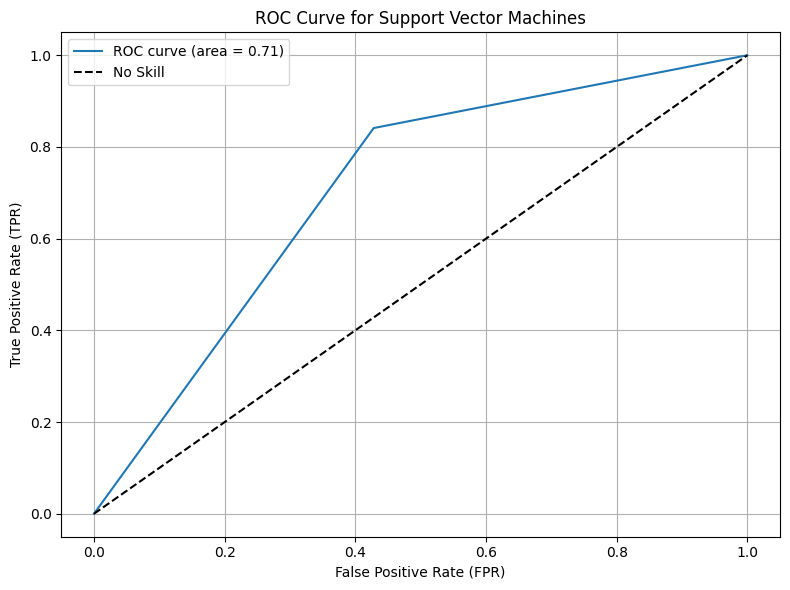

In [142]:
#3(iv)
SVclf = SVC(kernel='linear')
SVclf.fit(X_train, y_train)
y_pred=SVclf.predict(X_test)

print("Support Vector Machines")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))


cm = confusion_matrix(y_test, y_pred)
tn,fp, fn, tp = cm.ravel()

sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
precision = tp/(tp+fp)
print("Precision:", precision)
print("Sensitivity:", sensitivity)
print("Specificity:", specificity)


#ROC Curve:

fpr, tpr, thresholds = roc_curve(y_test, y_pred)  
roc_auc = roc_auc_score(y_test, y_pred) 

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Support Vector Machines')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### ROC Curve

DT AUC: 0.7438407236326905
RF AUC2: 0.8744634608618673
SVM AUC3: 0.7984417382619651
LR AUC4: 0.7901453847987199


<function matplotlib.pyplot.show(close=None, block=None)>

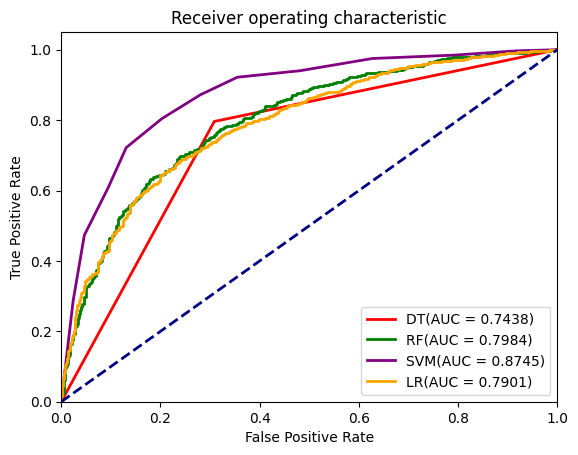

In [134]:
#####Predict probabilities for the test data.
probsDT = DTclf.predict_proba(X_test)
####Keep Probabilities of the positive class only.
probsDT = probsDT[:, 1]
#####Predict probabilities for the test data.
probsRF = RFclf.predict_proba(X_test)
####Keep Probabilities of the positive class only.
probsRF = probsRF[:, 1]
probsSV = SVclf.fit(X_train, y_train).decision_function(X_test)
## calculate the fpr and tpr for all thresholds of the classification
probs = logmodel.predict_proba(X_test)
predLR = probs[:,1]
###Compute the AUC Score.
auc = roc_auc_score(y_test, probsDT)
auc2 = roc_auc_score(y_test, probsRF)
auc3 = roc_auc_score(y_test, probsSV)
auc4 = roc_auc_score(y_test, predLR)
print('DT AUC:', auc)
print('RF AUC2:', auc2)
print('SVM AUC3:', auc3)
print('LR AUC4:', auc4)
###Get the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, probsDT)
fpr2, tpr2, thresholds2 = roc_curve(y_test, probsRF)
fpr3, tpr3, thresholds3 = roc_curve(y_test, probsSV)
fpr4, tpr4, thresholds4 = roc_curve(y_test, predLR)
####Plot ROC Curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='red',
         lw=lw, label='DT(AUC = %0.4f)' % auc)
plt.plot(fpr3, tpr3, color='green',
         lw=lw, label='RF(AUC = %0.4f)' % auc3)
plt.plot(fpr2, tpr2, color='purple',
         lw=lw, label='SVM(AUC = %0.4f)' % auc2)
plt.plot(fpr4, tpr4, color='orange',
         lw=lw, label='LR(AUC = %0.4f)' % auc4)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show
####################### ROC Curve ####################